# Introduction

This is sample code for semantic segmentaion with U-Net and Keras. You can also see SegNet at [Aerial Semantic Segmentation (SegNet, Keras)](https://www.kaggle.com/code/gokifujiya/aerial-semantic-segmentation-segnet-keras/notebook) and [Aerial Semantic Segmentation (U-Net, PyTorch)](https://www.kaggle.com/gokifujiya/aerial-semantic-segmentation-u-net-pytorch/notebook).

# Install packages

In [1]:
#!git clone https://github.com/divamgupta/image-segmentation-keras
!git clone https://github.com/rajeevratan84/image-segmentation-keras.git

Cloning into 'image-segmentation-keras'...
remote: Enumerating objects: 1165, done.
remote: Total 1165 (delta 0), reused 0 (delta 0), pack-reused 1165
Receiving objects: 100% (1165/1165), 3.29 MiB | 17.19 MiB/s, done.
Resolving deltas: 100% (750/750), done.


In [2]:
%cd image-segmentation-keras
!python setup.py install

/kaggle/working/image-segmentation-keras
/opt/conda/lib/python3.7/site-packages/setuptools/dist.py:726: UserWarning: Usage of dash-separated 'description-file' will not be supported in future versions. Please use the underscore name 'description_file' instead
  % (opt, underscore_opt)
running install
/opt/conda/lib/python3.7/site-packages/setuptools/command/install.py:37: SetuptoolsDeprecationWarning: setup.py install is deprecated. Use build and pip and other standards-based tools.
  setuptools.SetuptoolsDeprecationWarning,
/opt/conda/lib/python3.7/site-packages/setuptools/command/easy_install.py:159: EasyInstallDeprecationWarning: easy_install command is deprecated. Use build and pip and other standards-based tools.
  EasyInstallDeprecationWarning,
running bdist_egg
running egg_info
creating keras_segmentation.egg-info
writing keras_segmentation.egg-info/PKG-INFO
writing dependency_links to keras_segmentation.egg-info/dependency_links.txt
writing entry points to keras_segmentation.eg

# Read the CSV File

In [3]:
import pandas as pd
df = pd.read_csv('/kaggle/input/semantic-drone-dataset/class_dict_seg.csv')
df.head()

,name,r,g,b
0,unlabeled,0,0,0
1,paved-area,128,64,128
2,dirt,130,76,0
3,grass,0,102,0
4,gravel,112,103,87


In [4]:
df.name

0       unlabeled
1      paved-area
2            dirt
3           grass
4          gravel
5           water
6           rocks
7            pool
8      vegetation
9            roof
10           wall
11         window
12           door
13          fence
14     fence-pole
15         person
16            dog
17            car
18        bicycle
19           tree
20      bald-tree
21      ar-marker
22       obstacle
23    conflicting
Name: name, dtype: object

In [5]:
class_list = df.name.values.tolist()
print(class_list)
len(class_list)

['unlabeled', 'paved-area', 'dirt', 'grass', 'gravel', 'water', 'rocks', 'pool', 'vegetation', 'roof', 'wall', 'window', 'door', 'fence', 'fence-pole', 'person', 'dog', 'car', 'bicycle', 'tree', 'bald-tree', 'ar-marker', 'obstacle', 'conflicting']


24

# Sample Images

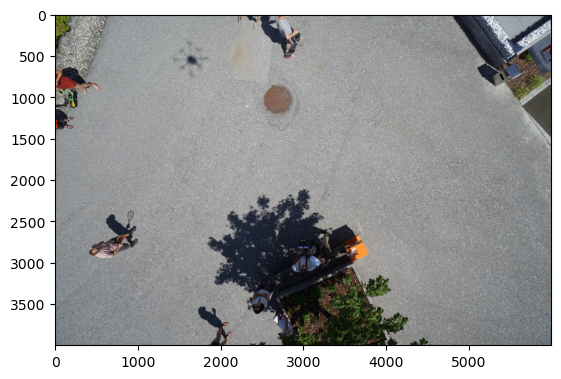

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
# original image
image = Image.open('/kaggle/input/semantic-drone-dataset/dataset/semantic_drone_dataset/original_images/000.jpg')
image = np.array(image)
plt.imshow(image)

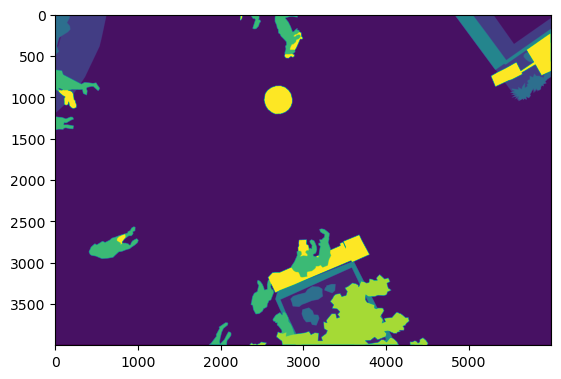

In [7]:
# label image
label = Image.open('/kaggle/input/semantic-drone-dataset/dataset/semantic_drone_dataset/label_images_semantic/000.png')
label = np.array(label)
plt.imshow(label)

In [8]:
image.shape, label.shape

((4000, 6000, 3), (4000, 6000))

In [9]:
image.min(), image.max()

(0, 255)

In [10]:
label.min(), label.max()

(0, 22)

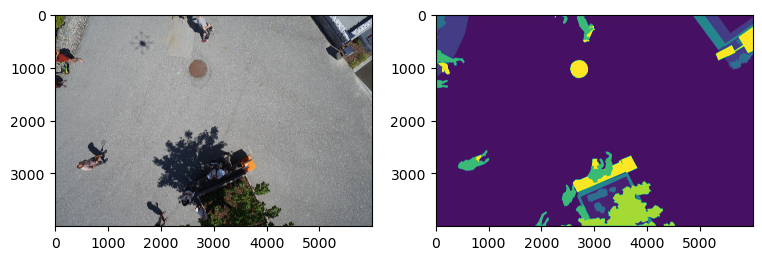

In [11]:
plt.figure(figsize = (9, 4))

plt.subplot(1, 2, 1)
plt.imshow(image)

plt.subplot(1, 2, 2)
plt.imshow(label)

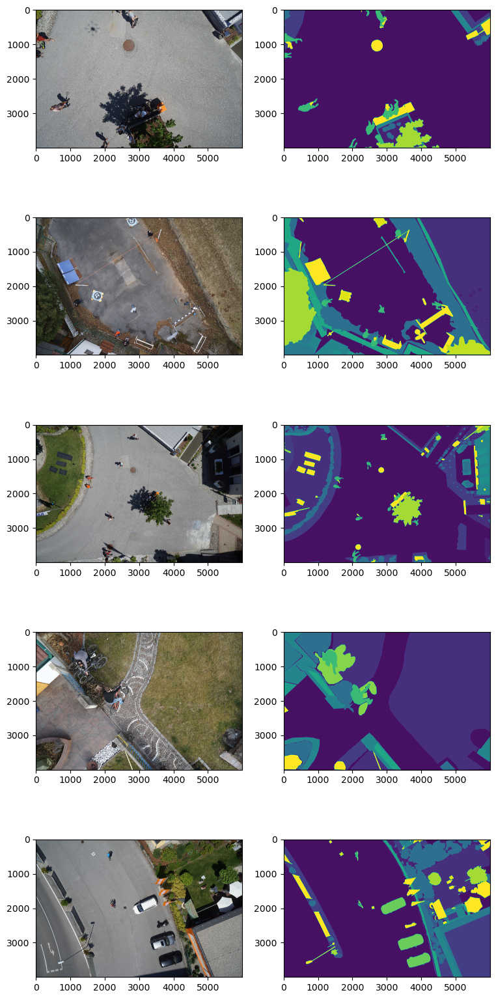

In [12]:
# 5 pairs of original and label images
n_max_imgs = 5

plt.figure(figsize = (9, 20))
for n in range(n_max_imgs):

    image = Image.open(f'/kaggle/input/semantic-drone-dataset/dataset/semantic_drone_dataset/original_images/00{n}.jpg')
    image = np.array(image)

    label = Image.open(f'/kaggle/input/semantic-drone-dataset/dataset/semantic_drone_dataset/label_images_semantic/00{n}.png')
    label = np.array(label)

    plt.subplot(n_max_imgs, 2, 2 * n + 1)
    plt.imshow(image)

    plt.subplot(n_max_imgs, 2, 2 * n + 2)
    plt.imshow(label)

# Take the Paths for the Data Images

In [13]:
from glob import glob
images = sorted(glob('/kaggle/input/semantic-drone-dataset/dataset/semantic_drone_dataset/original_images/*.jpg'))
#print(images)

In [14]:
len(images)

400

In [15]:
labels = sorted(glob('/kaggle/input/semantic-drone-dataset/dataset/semantic_drone_dataset/label_images_semantic/*.png'))
#print(labels)

In [16]:
len(labels)

400

# Divide the Data into Training and Validation

In [17]:
from sklearn.model_selection import train_test_split
import os

# Define the paths to the image and annotation directories.
image_dir = '/kaggle/input/semantic-drone-dataset/dataset/semantic_drone_dataset/original_images/'
annotation_dir = '/kaggle/input/semantic-drone-dataset/dataset/semantic_drone_dataset/label_images_semantic/'

# Get a list of all the image files.
image_files = os.listdir(image_dir)

# Split the data into a training set and a validation set.
train_files, val_files = train_test_split(image_files, test_size = 0.2, random_state = 42)

# Define the paths to the training and validation directories.
train_images = [os.path.join(image_dir, file) for file in train_files]
train_annotations = [os.path.join(annotation_dir, os.path.splitext(file)[0] + '.png') for file in train_files]
val_images = [os.path.join(image_dir, file) for file in val_files]
val_annotations = [os.path.join(annotation_dir, os.path.splitext(file)[0] + '.png') for file in val_files]

In [18]:
import shutil

# Define the destination directory.
destination_dir = '/kaggle/working/train_images'

# Create the destination directory if it doesn't exist.
if not os.path.exists(destination_dir):
    os.makedirs(destination_dir)

# Copy the images to the destination directory.
for path in train_images:
    shutil.copy2(path, destination_dir)

In [19]:
# Define the destination directory.
destination_dir = '/kaggle/working/train_annotations'

# Create the destination directory if it doesn't exist.
if not os.path.exists(destination_dir):
    os.makedirs(destination_dir)

# Copy the images to the destination directory.
for path in train_annotations:
    shutil.copy2(path, destination_dir)

In [20]:
# Define the destination directory.
destination_dir = '/kaggle/working/val_images'

# Create the destination directory if it doesn't exist.
if not os.path.exists(destination_dir):
    os.makedirs(destination_dir)

# Copy the images to the destination directory.
for path in val_images:
    shutil.copy2(path, destination_dir)

In [21]:
# Define the destination directory.
destination_dir = '/kaggle/working/val_annotations'

# Create the destination directory if it doesn't exist.
if not os.path.exists(destination_dir):
    os.makedirs(destination_dir)

# Copy the images to the destination directory.
for path in val_annotations:
    shutil.copy2(path, destination_dir)

# Initialize the Model

In [22]:
# unlabeled, tree, gras, other vegetation, dirt, gravel, rocks, water, paved area, pool, person, dog, car
#, bicycle, roof, wall, fence, fence-pole, window, door, obstacle, bald-tree, ar-maker, conflicting 
from keras_segmentation.models.segnet import segnet

model = segnet(n_classes = len(class_list), input_height = 320, input_width = 640)

# Train the Model

In [23]:
import tensorflow as tf

# Train the model using the training set and validate using the validation set.
callback = tf.keras.callbacks.EarlyStopping(monitor = "val_loss", mode = "min", patience = 4)

model.train(train_images = '/kaggle/working/train_images', train_annotations = '/kaggle/working/train_annotations', 
            val_images = '/kaggle/working/val_images', val_annotations = '/kaggle/working/val_annotations', 
            checkpoints_path = '/tmp/vgg_unet_1', steps_per_epoch = 40, epochs = 15, callbacks = callback)

Verifying training dataset


100%|██████████| 320/320 [03:30<00:00,  1.52it/s]


Dataset verified! 
Epoch 1/15
40/40 [==============================] - 144s 4s/step - loss: 2.6094 - accuracy: 0.3933
Epoch 2/15
40/40 [==============================] - 138s 3s/step - loss: 2.0138 - accuracy: 0.5188
Epoch 3/15
40/40 [==============================] - 139s 3s/step - loss: 2.1288 - accuracy: 0.4616
Epoch 4/15
40/40 [==============================] - 161s 4s/step - loss: 1.7923 - accuracy: 0.5372
Epoch 5/15
40/40 [==============================] - 144s 4s/step - loss: 1.8742 - accuracy: 0.5060
Epoch 6/15
40/40 [==============================] - 142s 4s/step - loss: 1.6239 - accuracy: 0.5457
Epoch 7/15
40/40 [==============================] - 139s 3s/step - loss: 1.6754 - accuracy: 0.5139
Epoch 8/15
40/40 [==============================] - 166s 4s/step - loss: 1.4825 - accuracy: 0.5848
Epoch 9/15
40/40 [==============================] - 142s 4s/step - loss: 1.6241 - accuracy: 0.5351
Epoch 10/15
40/40 [==============================] - 141s 4s/step - loss: 1.4836 - accurac

# Save the Model

In [24]:
model.save('semantic_segmentation_model.h5')

# Prediction

In [25]:
pred = model.predict_segmentation(
    inp = val_images[0],
    out_fname = '/tmp/pred.jpg')

1/1 [==============================] - 1s 956ms/step


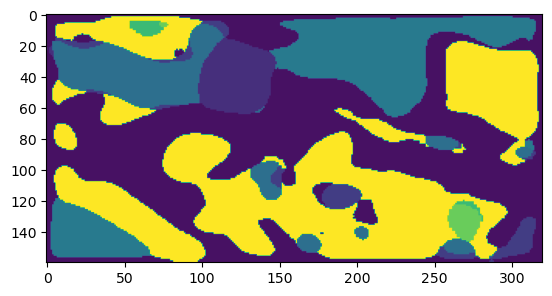

In [26]:
plt.imshow(pred)

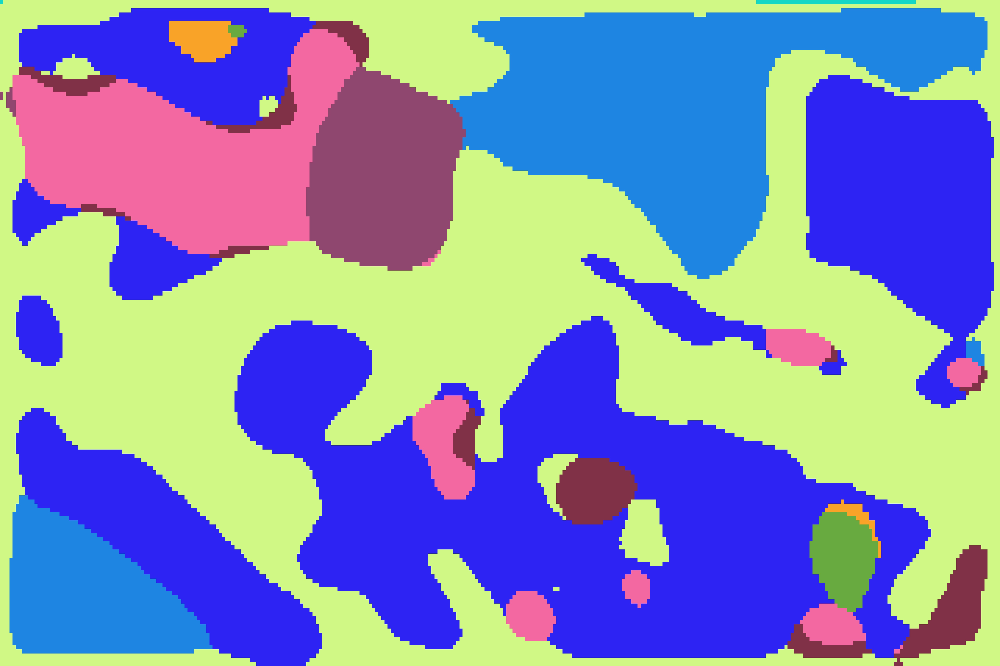

In [27]:
from IPython.display import Image
Image('/tmp/pred.jpg')

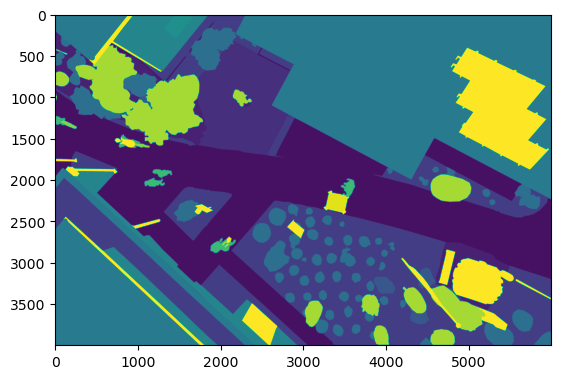

In [28]:
from PIL import Image
truth = Image.open(val_annotations[0])
truth = np.array(truth)
plt.imshow(truth)

# Display with Legend

In [29]:
pred_legend = model.predict_segmentation(
    inp = val_images[0],
    out_fname = '/tmp/pred.jpg' , overlay_img = True, show_legends = True,
    class_names = class_list)

1/1 [==============================] - 0s 402ms/step


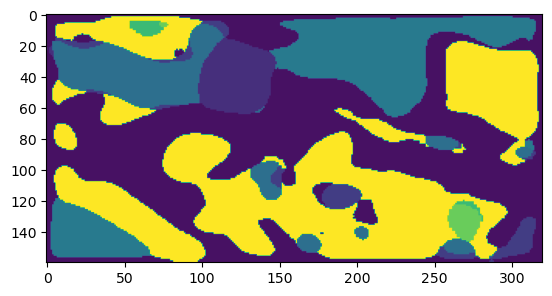

In [30]:
plt.imshow(pred_legend)

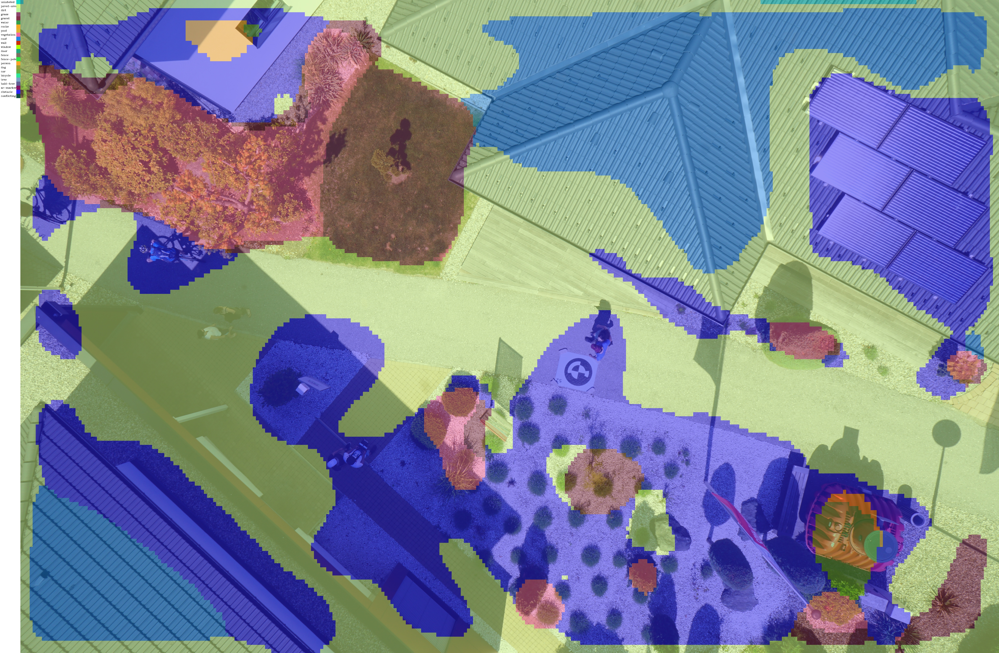

In [31]:
from IPython.display import Image
Image('/tmp/pred.jpg')

# Comparison of Other Data

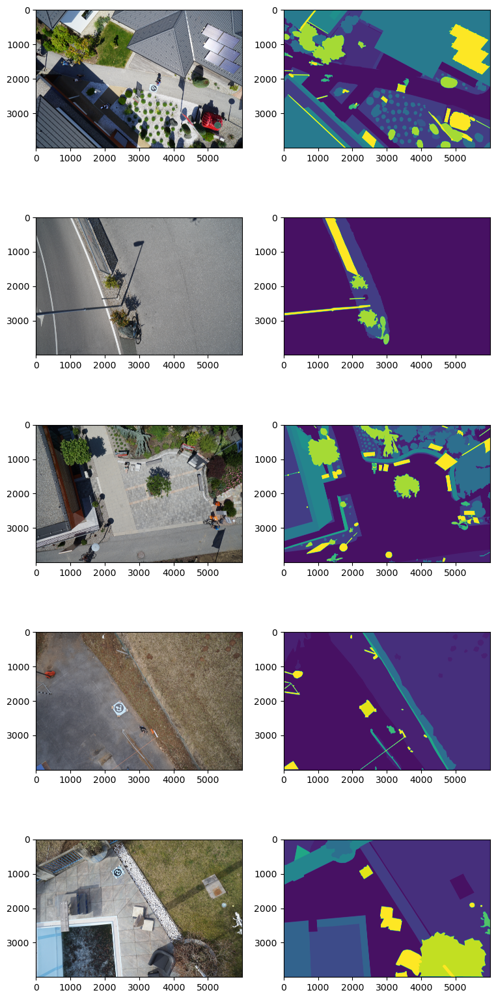

In [32]:
# 5 pairs of original and label images from the validation data
from PIL import Image
n_max_imgs = 5

plt.figure(figsize = (9, 20))
for n in range(n_max_imgs):

    image = Image.open(val_images[n])
    image = np.array(image)

    label = Image.open(val_annotations[n])
    label = np.array(label)

    plt.subplot(n_max_imgs, 2, 2 * n + 1)
    plt.imshow(image)

    plt.subplot(n_max_imgs, 2, 2 * n + 2)
    plt.imshow(label)

1/1 [==============================] - 0s 416ms/step


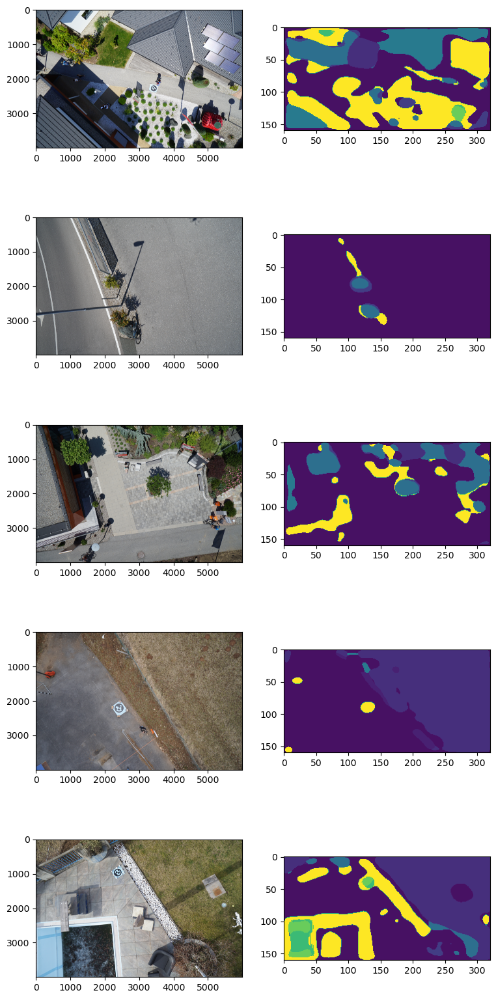

In [33]:
# 5 pairs of original and predicted images from the validation data
n_max_imgs = 5

plt.figure(figsize = (9, 20))
for n in range(n_max_imgs):

    image = Image.open(val_images[n])
    image = np.array(image)

    label = model.predict_segmentation(
            inp = val_images[n],
            out_fname = '/tmp/pred.jpg', overlay_img = True, show_legends = True,
            class_names = class_list)

    plt.subplot(n_max_imgs, 2, 2 * n + 1)
    plt.imshow(image)

    plt.subplot(n_max_imgs, 2, 2 * n + 2)
    plt.imshow(label)

In [34]:
# The trained model can be used later.
from tensorflow.keras.models import load_model
model = load_model('/kaggle/working/image-segmentation-keras/semantic_segmentation_model.h5')

In [35]:
model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 320, 640, 3)]     0         
                                                                 
 zero_padding2d (ZeroPadding  (None, 322, 642, 3)      0         
 2D)                                                             
                                                                 
 conv2d (Conv2D)             (None, 320, 640, 64)      1792      
                                                                 
 batch_normalization (BatchN  (None, 320, 640, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 320, 640, 64)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 160, 320, 64)     0   